In [2]:
using FileIO
using CSV
using DataFrames
using Statistics
using StatsPlots
using BSON: @save, @load #BSON is the Julia equivalent of pickle
using HDF5
using Distances

using CUDA 
using Flux
using ProgressMeter

using Flux, Statistics
using Flux.Data: DataLoader
using Flux:flatten
using Flux.Losses: mse
using Base: @kwdef
import Random
using CUDA

function load_hdf_embed_checkpoint(hdf_filepath)
    h5open(hdf_filepath, "r") do file
        article_ids = read(file["article_ids"])
        targets = read(file["targets"])
        #global text_subtext_embeds = read(file["text_subtext_embeddings"])
        #global subtext_embeds_attn_masks = read(file["subtext_embeddings_attention_masks"])
        text_embeds = read(file["text_embeddings"])

        #@show typeof(article_ids), size(article_ids)
        #@show typeof(targets), size(targets)
        #@show typeof(text_subtext_embeds), size(text_subtext_embeds)
        #@show typeof(subtext_embeds_attn_masks), size(subtext_embeds_attn_masks)
        #@show typeof(text_embeds), size(text_embeds)

        return article_ids, targets, text_embeds
    end
end

function load_predict_ready_data(predict_feature, input_type, embed_type, batch_size, device, return_loaders)
    #predict_feature, input_type, embed_type
    #base_folder = "./embed_checkpoints/" * predict_feature * "/" * input_type * "/"
    base_folder = "S:\\Sync\\University\\2023_MRP_1\\MRP1_WorkDir\\model_scripts\\embed_checkpoints\\" * predict_feature * "\\" * input_type * "\\"
    predict_feature = predict_feature == "sentiment" ? "_senti" : ""
    #predict_feature = input_type == "subtextLevel" ? predict_feature * "_subtextLevel" : predict_feature
    exchange_model = embed_type == "xlnet" ? true : false
    embed_type = embed_type == "xlnet" ? "zero" : embed_type
    if input_type == "headline"
        train_data_filepath = base_folder * "train$(predict_feature)_distilroberta_$(embed_type)_embeddings.hdf5"
    elseif input_type == "body"
        train_data_filepath = base_folder * "train$(predict_feature)_distilroberta_body_$(embed_type)_embeddings.hdf5"
    elseif input_type == "subtextLevel"
        train_data_filepath = base_folder * "train$(predict_feature)_subtextLevel_distilroberta_$(embed_type)_embeddings.hdf5"
    end

    if exchange_model
        train_data_filepath = replace(train_data_filepath, "distilroberta" => "xlnet")
    end


    #train_data_filepath = "./embed_checkpoints/engagement/train_roberta_zero_embeddings.hdf5"

    article_ids, targets, text_embeds = load_hdf_embed_checkpoint(train_data_filepath)    
    embed_size = size(text_embeds, 1)
    X_train = Float32.(text_embeds) |> device
    y_train = Float32.(targets) |> device

    test_data_filepath = replace(train_data_filepath, "train" => "test")
    article_ids, targets, text_embeds = load_hdf_embed_checkpoint(test_data_filepath)
    X_val = Float32.(text_embeds) |> device
    y_val = Float32.(targets) |> device


    #Normalize arrays such that each column has a mean of 0 and a standard deviation of 1
    X_train = (X_train .- mean(X_train, dims=1)) ./ std(X_train, dims=1)
    X_val = (X_val .- mean(X_val, dims=1)) ./ std(X_val, dims=1)

    if return_loaders
        return DataLoader((X_train, y_train), batchsize=batch_size, shuffle=true), DataLoader((X_val, y_val), batchsize=8, shuffle=false), embed_size
    else
        return X_train, y_train, X_val, y_val, embed_size
    end
end


using Statistics, GLM

function variance_inflation_factor(X)
    vif_dict = Dict()
    for i in 1:size(X, 1)
        y = convert(Vector{Float64}, X[i, :])
        X_rest = X[1:end .!= i, :]

        # Add an intercept (constant term) to X_rest
        X_rest = vcat(ones(1, size(X_rest, 2)), X_rest)

        # Perform linear regression of y on X_rest
        model = lm(X_rest', y)

        r2 = GLM.r2(model)
        vif = 1 / (1 - r2)

        vif_dict[i] = vif
    end
    return vif_dict
end


variance_inflation_factor (generic function with 1 method)

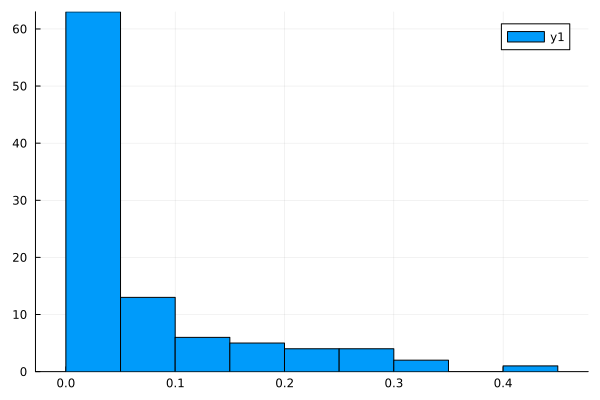

size(pair_cos_sim) = (98, 98)

In [3]:

X_input_1, _ ,_, _ = load_predict_ready_data("engagement", 
                                            "headline", #"subtextLevel", "headline", "body"
                                            "zero", #"SimCE-Head-Body", "CosSim" # 
                                            32, cpu, false)

X_input_2, _ ,_, _ = load_predict_ready_data("engagement", 
                                            "subtextLevel", #"subtextLevel", "headline", "body"
                                            "zero", #"SimCE-Head-Body", "CosSim" # 
                                            32, cpu, false)


pair_cos_sim = pairwise(cosine_dist,  X_input_1, X_input_2, dims=2)
#Plot pair_cos_sim as heatmap
@show size(pair_cos_sim)
#display(heatmap(pair_cos_sim))
using LinearAlgebra


#Pair_cos_sim histogram of values
display(histogram(diag(pair_cos_sim)))

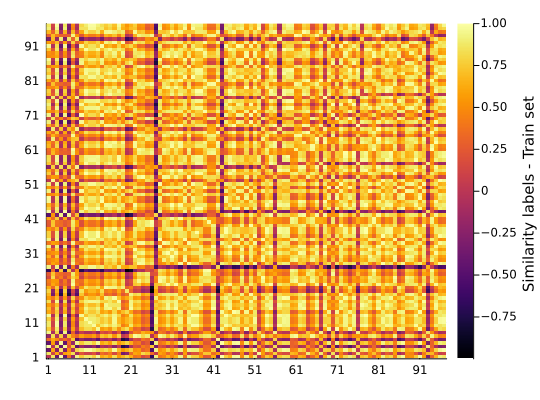

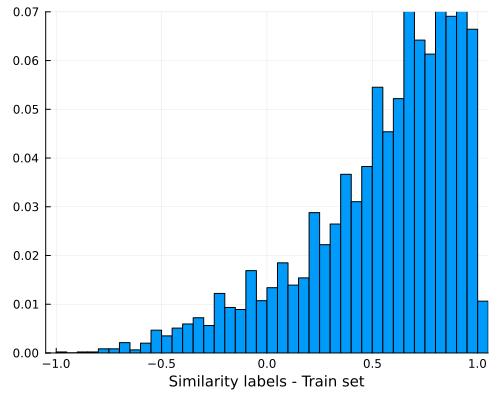

size(M) = (97, 97)

In [9]:
using NPZ

using LinearAlgebra

function reconstruct_symmetric(v::Vector{T}) where T
    n = isqrt(2*length(v))
    if n * (n + 1) ÷ 2 != length(v)
        throw(ArgumentError("The length of the vector is not valid for a symmetric matrix."))
    end

    M = Matrix{T}(undef, n, n)
    k = 1
    for i in 1:n
        for j in i:n
            M[i, j] = v[k]
            if i != j
                M[j, i] = v[k]
            end
            k += 1
        end
    end
    return M
end

# Example
M = reconstruct_symmetric(npzread("S:\\Sync\\University\\2023_MRP_1\\MRP1_WorkDir\\model_scripts\\embed_checkpoints\\label_collection.npy"))
@show size(M)


hm = heatmap(M, xticks=1:10:1000, yticks=1:10:1000, size=(540,400), margin=4Plots.mm,  colorbar_title="\nSimilarity labels - Train set ")
display(hm)

histplt = histogram(reshape(M,:), normalize=:probability, legend=false, xlabel="Similarity labels - Train set", size=(500,400), xguidefontsize=10)
xlims!(-1.05, 1.05)
ylims!(0, 0.07)
display(histplt)

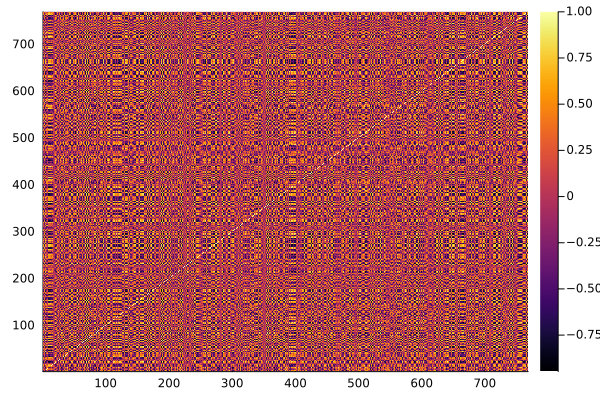

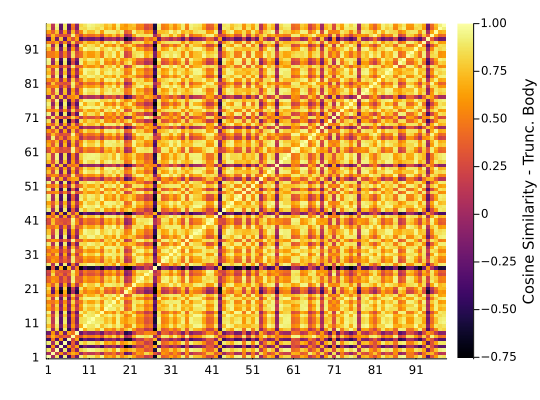

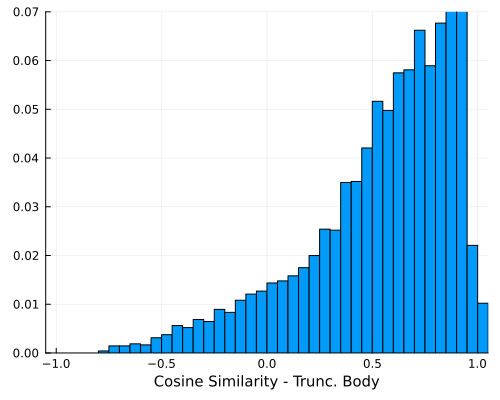

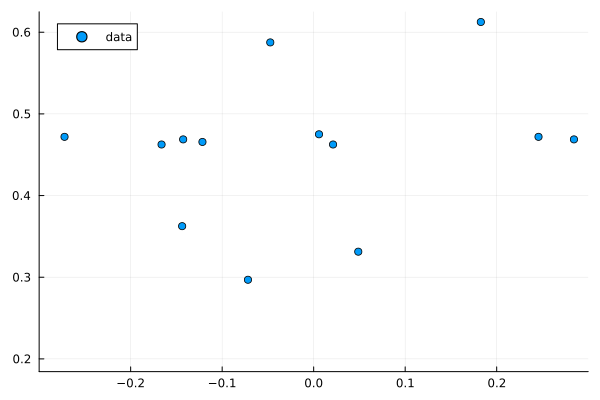

std(X_train, dims = 1) = Float32[0.9999998 1.0000001 1.0000001 0.9999999 1.0 0.99999994 1.0 1.0 1.0 1.0 1.0 0.99999994 1.0 0.9999999 1.0 1.0 1.0000001 0.99999994 1.0000001 0.99999994 1.0000001 1.0000001 1.0 1.0 1.0000001 1.0 0.9999998 1.0 0.99999994 1.0 0.9999998 1.0000001 0.9999998 1.0 1.0 1.0000001 1.0000001 1.0 0.9999998 0.9999999 0.99999994 1.0 0.9999999 0.99999994 1.0000001 1.0000001 1.0000002 0.9999997 0.99999994 1.0 0.99999994 1.0000001 0.9999999 0.99999994 1.0 1.0 0.9999999 1.0 1.0 1.0 0.9999999 1.0000001 0.9999999 1.0 0.9999999 1.0 1.0 1.0 0.9999999 1.0 0.9999998 0.99999994 0.99999994 1.0 1.0 0.99999994 1.0 0.99999994 1.0 1.0 0.9999999 1.0 1.0000001 0.9999999 1.0000001 1.0 0.9999999 0.9999998 0.99999994 1.0 0.99999994 0.9999999 0.9999998 0.9999999 0.99999994 1.0000001 0.99999994 1.0]
mean(std(X_train, dims = 1)) = 1.0f0


mean(std(X_val, dims = 1)) = 1.0f0


ErrorException: syntax: unexpected ","

In [4]:

X_train, y_train, X_val, y_val = load_predict_ready_data("sentiment", 
                                                        "body", #"subtextLevel", "headline", "body"
                                                        "CosSim", #"SimCE-Head-Body",# "xlnet", #"SimCE-Head-Body", "CosSim" # xlnet
                                                        32, cpu, false)

#For engagement: body input gives simce advantage while headline gives cossim (label-based!) advantage
# for subtextLevel no large differences between zero and the other mdoes

#For sentiment: 
#Same story as for engagment for subtextLevel

#For sentiment: headline input goes very high (especially with simce) while body input is strong advantage for cossim
# ------ Training set ------

#Sum of std of each embedding feature:
@show std(X_train, dims=1)
@show mean(std(X_train, dims=1))

cor_matrix = cor(X_train')
train_hm = heatmap(cor_matrix)
display(train_hm)


#X_train = cat(X_train, X_val, dims=2)

pair_cos_sim = pairwise(cosine_dist, X_train, dims=2)
#Plot pair_cos_sim as heatmap
pair_cos_sim = 1.0 .- pair_cos_sim 
train_hm = heatmap(pair_cos_sim, xticks=1:10:1000, yticks=1:10:1000, size=(540,400), margin=4Plots.mm,  colorbar_title="\nCosine Similarity - Trunc. Body")

display(train_hm)
#Save plot to file
#savefig(train_hm, "pair_cos_sim_trunc_body.png", dpi=300)

#Pair_cos_sim histogram of values
histplt = histogram(reshape(pair_cos_sim,:), normalize=:probability, legend=false, xlabel="Cosine Similarity - Trunc. Body", size=(500,400), xguidefontsize=10)
xlims!(-1.05, 1.05)
ylims!(0, 0.07)
display(histplt)
#Save plot to file
#savefig(histplt, "hist_pair_cos_sim_trunc_body.png", dpi=300)

hidden_feat_idx = 4
feat_scat = scatter(X_train[hidden_feat_idx, :], y_train[1, :], label="data")
xlims!(-0.3, 0.3)
display(feat_scat)

# ------ Validation set ------
@show mean(std(X_val, dims=1))
pair_cos_sim = pairwise(cosine_dist, X_val, dims=2)
#Plot pair_cos_sim as heatmap
val_hm = heatmap(pair_cos_sim, xticks=1:10:1000, yticks=1:10:1000,, margin=4Plots.mm,  colorbar_title="\nCosine Similarity - Headlines")
display(val_hm)
display(histogram(reshape(pair_cos_sim,:)))


In [4]:
size(X_train)
#Check if columns in X_train are normalized
@show sum(X_train, dims=1)

sum(X_train, dims = 1) = Float32[1.1920929f-7 -3.33786f-6 -6.198883f-6 -4.708767f-6 1.257658f-5 -4.6491623f-6 1.1712313f-5 6.198883f-6 7.033348f-6 4.23193f-6 2.9802322f-7 -6.0815364f-6 9.141862f-6 3.963709f-6 -5.841255f-6 -6.4969063f-6 7.927418f-6 -7.897615f-6 4.887581f-6 1.6331673f-5 4.8540533f-6 8.225441f-6 -2.682209f-7 -5.8710575f-6 1.2636185f-5 -1.7881393f-7 -9.782612f-6 -7.390976f-6 -1.1980534f-5 -2.5629997f-6 -1.3617799f-5 5.066395f-6 -5.5134296f-7 7.748604f-6 -1.9967556f-6 -1.3887882f-5 -1.475215f-6 -8.34465f-7 1.66893f-6 -5.722046f-6 1.0624528f-5 4.23193f-6 1.2755394f-5 -1.013279f-5 -4.053116f-6 -6.914139f-6 -5.6624413f-6 -7.4207783f-6 -5.066395f-6 -4.544854f-6 -5.438924f-6 -1.1622906f-5 -9.506941f-6 4.4703484f-6 -1.5669502f-6 -1.2010336f-5 -7.5101852f-6 2.2649765f-6 -1.6450882f-5 -1.5318394f-5 -9.506941f-6 1.0251999f-5 1.8119812f-5 -6.236136f-6 -8.583069f-6 1.123175f-6 -8.046627f-7 4.4107437f-6 -1.0669231f-5 -5.543232f-6 2.041459f-6 -6.914139f-6 -4.053116f-6 -4.1276217f-6 -1.4

1×98 Matrix{Float32}:
 1.19209f-7  -3.33786f-6  -6.19888f-6  …  -9.56655f-6  -7.92742f-6

In [26]:
using Metrics

Epochs ...  22%|██████████                              |  ETA: 0:00:18

Epochs ...  75%|███████████████████████████████         |  ETA: 0:00:03

Epochs ... 100%|████████████████████████████████████████| Time: 0:00:12


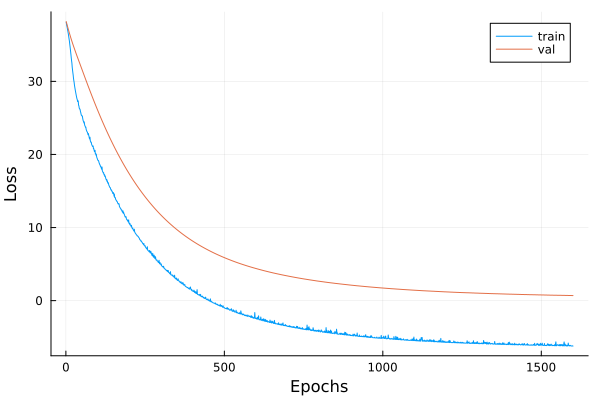

Train loss = 0.36788368
Validation loss = 0.29553133


Train RMSE = 0.6065342
Validation RMSE = 0.5436279
Mean: 0.54403824
Std: 0.49254492
RMSE: 0.5436279
MAE: 0.5153797
R2: 0.054087162
Tuple{Float32, Float32}[(0.375, 0.013798602

) (0.30625, 0.5319681) (0.53125, 0.016563155) (0.2625, 0.99802667) (0.4875, 0.9993923) (0.4125, 0.9996712) (0.50625, 0.00036320364) (0.325, 0.9996152) (0.50625, 0.9987596) (0.15625, 0.001345383) (0.25, 0.9995209) (0.225, 0.9991353) (0.3875, 0.00021050438) (0.375, 0.9993926) (0.25, 0.9782442) (0.30625, 0.99930084) (0.38125, 0.003529546) (0.375, 0.999253) (0.4125, 0.0024157786) (0.3875, 0.99841774) (0.525, 0.0002656527) (0.23125, 0.00081398647) (0.3625, 0.998276) (0.34375, 0.062266484) (0.46875, 0.00040876807)]


1×25 Matrix{Float32}:
 0.375  0.30625  0.53125  0.2625  …  0.23125  0.3625  0.34375  0.46875

In [29]:


# Define the loss function (mean squared error for regression)

rmse(y_model, y_true) = Flux.sqrt(Flux.mse(y_model, y_true))
mse_loss(y_model, y_true) = Flux.mse(y_model, y_true)
mae_loss(y_model, y_true) = Flux.mae(y_model, y_true)
huber_loss(y_model, y_true) = Flux.huber_loss(y_model, y_true)
msle_loss(y_model, y_true) = Flux.msle(y_model, y_true)


# L2 Regularization term
function regularization(model)
  return sum(x -> sum(abs2, x), Flux.params(model))
end

function dispersion(y_model, y_true)
    return -mean(abs.(y_model .- y_true) * abs.(y_model' .- y_model))
end

function eval_error(loader, model, device)
    cum_rmse = 0
    ntot = 0
    for (x, y) in loader
        ŷ = model(x)
        cum_rmse += rmse(ŷ, y)
        ntot += size(x)[end]
    end
    return cum_rmse/ntot
end



function objective(trial)
    #@show trial

    # fix seed for the RNG
    seed = 22
    Random.seed!(seed)

    # activate CUDA if possible
    device = CUDA.functional() ? gpu : cpu
    device = cpu
    
    # Create test and train dataloaders
    #batch_size = 16
    batch_size = trial["batch_size"]

    predict_feature = trial["predict_feature"]
    input_type = trial["input_type"]
    embed_type = trial["embed_type"]
    #predict_feature = "engagement" #, "sentiment"
    #input_type = "headline" #, "body"
    #embed_type = "zero" #, "SimCE-Head-Body", "CosSim"
    
    train_loader, val_loader, embed_size = load_predict_ready_data(predict_feature, input_type, embed_type, batch_size, device, true)

    # get suggested hyperparameters
    activation = relu
    # n_dense = trial["n_dense"]
    hidden_nodes = trial["hidden_nodes"]


    # Create the model with dense layers (fully connected)
    layers = []
    n_input = embed_size #Becomes hidden size after first dense layer
    for n in hidden_nodes[1:n_dense]
        push!(layers, Dense(n_input, n, activation))
        n_input = n
    end
    push!(layers, Dense(n_input, 1, Flux.sigmoid))
    model = Chain(layers) |> device
    # model parameters
    ps = Flux.params(model)  

    # hyperparameters for the optimizer
    η = trial["η"]
    λ = trial["λ"]

    # Instantiate the optimizer
    opt = AdamW(η)
    mae_loss_with_regular(y_model, y_true) = mae_loss(y_model, y_true) + λ * regularization(model) + 0.04*dispersion(y_model, y_true)
    mse_loss_with_regular(y_model, y_true) = mse_loss(y_model, y_true) + λ * regularization(model) + 0.006*dispersion(y_model, y_true)
    huber_loss_with_regular(y_model, y_true) = huber_loss(y_model, y_true) + λ * regularization(model) + 0.6*dispersion(y_model, y_true)
    loss_function = huber_loss_with_regular

    # Training
    n_epochs = trial["n_epochs"]
    #number of training epochs
    
    reg_error = 1.0
    train_losses = Float64[]
    val_losses = Float64[]
    @showprogress 5 "Epochs ... " for epoch in 1:n_epochs
        for epoch in 1:n_epochs
            total_train_loss = 0.0
            count = 0 
            for (x, y) in train_loader
                gs = gradient(Flux.params(model)) do
                    ŷ = model(x)
                    loss = loss_function(ŷ, y)
                    total_train_loss += loss
                    count += 1
                    return loss
                end
                Flux.Optimise.update!(opt, ps, gs)
            end
            push!(train_losses, total_train_loss / count)
            
            # Validation
            total_val_loss = 0.0
            count = 0
            for (x, y) in val_loader
                ŷ = model(x)
                loss = loss_function(ŷ, y)
                total_val_loss += loss
                count += 1
            end
            push!(val_losses, total_val_loss / count)


            # Compute intermediate accuracy error
            reg_error = eval_error(val_loader, model, device)

        end
    end

    # Plot the losses
    plt = plot(train_losses, label="train")
    plot!(val_losses, label="val")
    xlabel!("Epochs")
    ylabel!("Loss")
    display(plt)

    # return objective function value
    return model, device, reg_error
end


trial = Dict("n_dense" => 5, 
            "hidden_nodes" => [128, 64,32, 16, 8], 
            "η" => 0.0001, 
            "λ" => 0.1, 
            "n_epochs" => 40,
            "batch_size" => 64,
            "predict_feature" => "engagement", #"engagement",
            "input_type" => "body", #"headline",
            "embed_type" => "zero", #"SimCE-Head-Body", "CosSim", "zero"
            )


model, device, reg_error = objective(trial)
X_train, y_train, X_val, y_val, embed_size = load_predict_ready_data(trial["predict_feature"], trial["input_type"], trial["embed_type"],trial["batch_size"] , device, false)

println("Train loss = $(mse_loss(model(X_train), y_train))")
println("Validation loss = $(mse_loss(model(X_val), y_val))")
println("Train RMSE = $(rmse(model(X_train), y_train))")
println("Validation RMSE = $(rmse(model(X_val), y_val))")

y_pred = model(X_val) |> cpu
y_val = y_val |> cpu

println("Mean: $(mean(y_pred))")
println("Std: $(std(y_pred))")
println("RMSE: $(rmse(y_pred, y_val))")
println("MAE: $(mae_loss(y_pred, y_val))")
println("R2: $(Metrics.adjusted_r2_score(y_pred, y_val, size(X_val)[1]))")

println(collect(zip(y_val, y_pred)))

y_train_pred = model(X_train) |> cpu

X_train = X_train |> cpu
y_train = y_train |> cpu
X_val = X_val |> cpu
y_val = y_val |> cpu

n_probes = 98


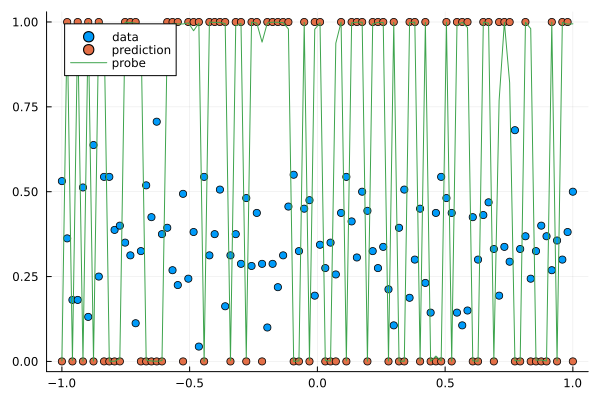

In [22]:

hidden_feat_idx = 11

n_probes = length(X_train[hidden_feat_idx, :])
@show n_probes
X_probe = X_train
X_probe[hidden_feat_idx, :] .= range(-1, 1, length=n_probes)
y_probe_pred = model(X_probe)

scatter(X_train[hidden_feat_idx, :], y_train[1, :], label="data")
scatter!(X_train[hidden_feat_idx, :], y_train_pred[1, :], label="prediction")
plot!(X_probe[hidden_feat_idx, :], y_probe_pred[1, :], label="probe")

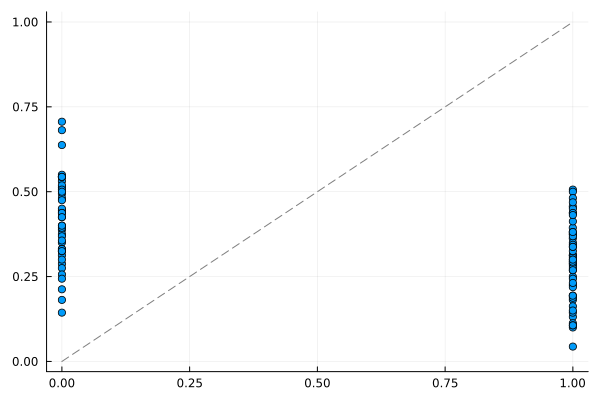

In [13]:
scatter(y_train_pred[1, :], y_train[1, :], legend=false)
#Diagonal line is the ideal
plot!([0, 1], [0, 1], linestyle=:dash, color=:black, alpha=0.5)
#legend!(false)

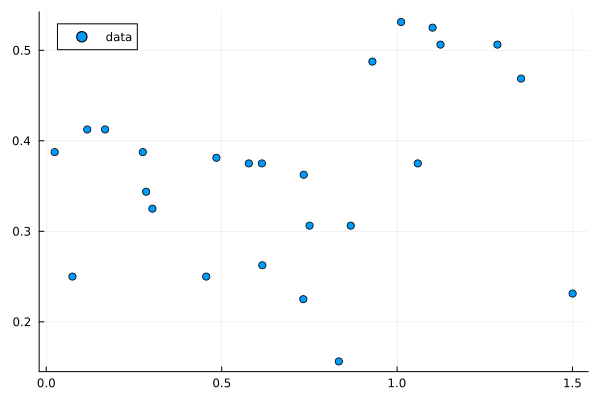

In [14]:

hidden_feat_idx = 3

scatter(X_val[hidden_feat_idx, :], y_val[1, :], label="data")
#x_eval = collect(range(minimum(X_train[1, :]), stop=maximum(X_train[1, :]), length=100)) |> device
#y_eval = reshape(model(reshape(x_eval, 1, :)), :) |> cpu
#plot!(x_eval, y_eval, label="fit")


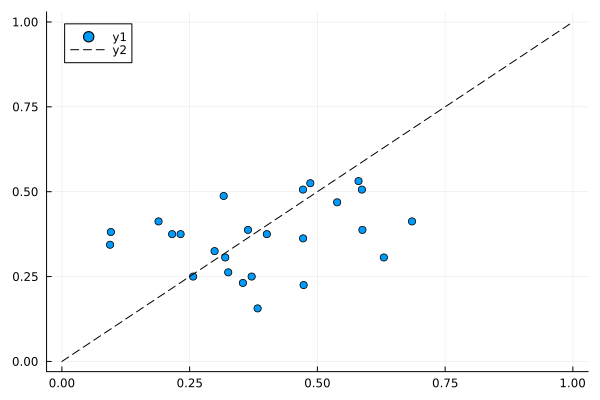

In [10]:
scatter(y_pred[1, :], y_val[1, :])
plot!([0, 1], [0, 1], linestyle=:dash, color=:black)

In [23]:
using HyperTuning


global batch_size = 16
global predict_feature = "engagement" #, "sentiment"
global input_type = "body" #, "body"
global embed_type = "zero" #, "SimCE-Head-Body", "CosSim"

function var_objective(trial)
    #@show trial

    # fix seed for the RNG
    seed = 22
    Random.seed!(seed)

    # activate CUDA if possible
    device = CUDA.functional() ? gpu : cpu
    device = cpu
    
    # Create test and train dataloaders
    #batch_size = 16
    #batch_size = trial["batch_size"]

    #predict_feature = trial["predict_feature"]
    #input_type = trial["input_type"]
    #embed_type = trial["embed_type"]
    #predict_feature = "engagement" #, "sentiment"
    #input_type = "headline" #, "body"
    #embed_type = "zero" #, "SimCE-Head-Body", "CosSim"
    
    train_loader, val_loader, embed_size = load_predict_ready_data(predict_feature, input_type, embed_type, batch_size, device, true)

    # get suggested hyperparameters
    activation = relu
    @suggest n_dense in trial
    @suggest hidden_nodes in trial


    # Create the model with dense layers (fully connected)
    layers = []
    n_input = embed_size #Becomes hidden size after first dense layer
    for n in hidden_nodes[1:n_dense]
        push!(layers, Dense(n_input, n, activation))
        n_input = n
    end
    push!(layers, Dense(n_input, 1, Flux.sigmoid))
    model = Chain(layers) |> device
    # model parameters
    ps = Flux.params(model)  

    # hyperparameters for the optimizer
    #η = trial["η"]
    #λ = trial["λ"]
    @suggest disp_coeff in trial
    @suggest η in trial
    @suggest λ in trial

    # Instantiate the optimizer
    opt = AdamW(η)
    mae_loss_with_regular(y_model, y_true) = mae_loss(y_model, y_true) + λ * regularization(model) + disp_coeff*dispersion(y_model, y_true)
    mse_loss_with_regular(y_model, y_true) = mse_loss(y_model, y_true) + λ * regularization(model) + disp_coeff*dispersion(y_model, y_true)
    loss_function = mse_loss_with_regular

    # Training
    @suggest n_epochs in trial
    #n_epochs = trial["n_epochs"]
    #number of training epochs
    
    reg_error = 1.0
    train_losses = Float64[]
    val_losses = Float64[]
    @showprogress 5 "Epochs ... " for epoch in 1:n_epochs
        for epoch in 1:n_epochs
            total_train_loss = 0.0
            count = 0 
            for (x, y) in train_loader
                gs = gradient(Flux.params(model)) do
                    ŷ = model(x)
                    loss = loss_function(ŷ, y)
                    total_train_loss += loss
                    count += 1
                    return loss
                end
                Flux.Optimise.update!(opt, ps, gs)
            end
            push!(train_losses, total_train_loss / count)
            
            # Validation
            total_val_loss = 0.0
            count = 0
            for (x, y) in val_loader
                ŷ = model(x)
                loss = loss_function(ŷ, y)
                total_val_loss += loss
                count += 1
            end
            push!(val_losses, total_val_loss / count)


            # Compute intermediate accuracy error
            reg_error = eval_error(val_loader, model, device)

            # report value to pruner
            report_value!(trial, reg_error)
            # check if pruning is necessary
            should_prune(trial) && (return)
        end
    end

    # if accuracy is over 90%, then trials is considered as feasible
    reg_error < 0.005 && report_success!(trial)
    # return objective function value
    return model, device, reg_error
end



function main() 
    # maximum and minimum number of dense layers
    MIN_DENSE = 2
    MAX_DENSE = 5

    scenario = Scenario(### hyperparameters
                        # data filepath
                        # ["headline", "body"]
                        # ["zero", "CosSim", "SimCE-Head-Body"]
                        # learning rates
                        η = (1e-9..1e-2),
                        # regularization parameter
                        λ = (0.0001..0.01),
                        # activation functions
                        #activation = [leakyrelu, relu],
                        disp_coeff = (0.0..0.01),
                        # loss functions
                        #loss = [mse, logitcrossentropy],
                        # number of dense layers
                        n_dense = MIN_DENSE:MAX_DENSE,
                        # number of neurons for each dense layer
                        hidden_nodes = Bounds(fill(4, MAX_DENSE), fill(128, MAX_DENSE)),
                        # number of epochs
                        n_epochs = (20..100),
                        ### Common settings
                        pruner= MedianPruner(start_after = 5#=trials=#, prune_after = 10#=epochs=#),
                        verbose = true, # show the log
                        max_trials = 4, # maximum number of hyperparameters computed

                    )


    display(scenario)

    # minimize accuracy error
    HyperTuning.optimize(var_objective, scenario) 
end

main()

Scenario:
          parameters: disp_coeff, hidden_nodes, n_dense, n_epochs, η, λ
   space cardinality: Huge!
           instances: 1
          batch_size: 16
             sampler: BCAPSampler{Random.Xoshiro}
              pruner: MedianPruner
          max_trials: 4
           max_evals: 4


Epochs ...   2%|█                                       |  ETA: 0:04:19

Epochs ...   4%|██                                      |  ETA: 0:05:05

Epochs ...   6%|███                                     |  ETA: 0:05:28

Epochs ...   9%|████                                    |  ETA: 0:05:28

Epochs ...  11%|█████                                   |  ETA: 0:05:13

Epochs ...  13%|██████                                  |  ETA: 0:04:51

Epochs ...  16%|███████                                 |  ETA: 0:04:22

Epochs ...  18%|████████                                |  ETA: 0:04:09

Epochs ...  20%|█████████                               |  ETA: 0:03:57

Epochs ...  23%|██████████                              |  ETA: 0:03:40

Epochs ...  27%|███████████                             |  ETA: 0:03:26

Epochs ...  30%|████████████                            |  ETA: 0:03:13

Epochs ...  32%|█████████████                           |  ETA: 0:03:06

Epochs ...  34%|██████████████                          |  ETA: 0:02:58

Epochs ...  37%|███████████████                         |  ETA: 0:02:48

Epochs ...  40%|█████████████████                       |  ETA: 0:02:37

Epochs ...  44%|██████████████████                      |  ETA: 0:02:28

Epochs ...  47%|███████████████████                     |  ETA: 0:02:18

Epochs ...  49%|████████████████████                    |  ETA: 0:02:12

Epochs ...  52%|█████████████████████                   |  ETA: 0:02:03

Epochs ...  55%|███████████████████████                 |  ETA: 0:01:54

Epochs ...  59%|████████████████████████                |  ETA: 0:01:45

Epochs ...  62%|█████████████████████████               |  ETA: 0:01:37

Epochs ...  65%|██████████████████████████              |  ETA: 0:01:28

Epochs ...  68%|████████████████████████████            |  ETA: 0:01:20

Epochs ...  71%|█████████████████████████████           |  ETA: 0:01:11

Epochs ...  74%|██████████████████████████████          |  ETA: 0:01:03

Epochs ...  78%|████████████████████████████████        |  ETA: 0:00:55

Epochs ...  81%|█████████████████████████████████       |  ETA: 0:00:47

Epochs ...  84%|██████████████████████████████████      |  ETA: 0:00:39

Epochs ...  87%|███████████████████████████████████     |  ETA: 0:00:31

Epochs ...  90%|█████████████████████████████████████   |  ETA: 0:00:23

Epochs ...  94%|██████████████████████████████████████  |  ETA: 0:00:16

Epochs ...  97%|███████████████████████████████████████ |  ETA: 0:00:08

Epochs ... 100%|████████████████████████████████████████| Time: 0:04:03


MethodError: MethodError: Cannot `convert` an object of type 
  Tuple{Chain{Vector{Dense{F, Matrix{Float32}, Vector{Float32}} where F}}, typeof(cpu), Float32} to an object of type 
  Union{Float64, Vector{Float64}}

Closest candidates are:
  convert(::Type{T}, !Matched::T) where T
   @ Base Base.jl:64


In [ ]:

# Simple 2-layer MLP for regression with flux.jl

# Define the network architecture
embed_size = size(X_train, 1)
num_targets = size(y_train, 1)

if CUDA.functional()
  device = gpu
else
  device = cpu
end


X_train = X_train |> device
y_train = y_train |> device
X_val = X_val |> device
y_val = y_val |> device

println("Train set size: $(size(X_train)) Validation set size: $(size(X_val))")
train_data = (X_train, y_train)
val_data = (X_val, y_val)
train_dataloader = Flux.Data.DataLoader(train_data, batchsize=64, shuffle=true)
val_dataloader = Flux.Data.DataLoader(val_data, batchsize=16, shuffle=false)


hidden_size = 16*num_targets
model = Chain(
  #Dense(embed_size, num_targets),
  Dense(embed_size, hidden_size, relu), 
  Dense(hidden_size, hidden_size, relu),
  #Dense(hidden_size, hidden_size, relu),
  Dense(hidden_size, num_targets)
) |> device


#model = AttentionModel(embed_size) |> device


# Define the loss function (mean squared error for regression)
mse_loss(y_model, y_true) = Flux.mse(y_model, y_true)

λ = 0.01
# L2 Regularization term
function regularization(model)
  return sum(x -> sum(abs2, x), Flux.params(model))
end
mse_loss_with_L2regular(y_model, y_true) = mse_loss(y_model, y_true) + λ * regularization(model)


# Define the optimization method

optimizer = AdamW(8E-6) #ADAM(8E-5)
loss_function = mse_loss_with_L2regular

# Train the network
n_epochs = 10000

train_losses = Float64[]
val_losses = Float64[]

@showprogress 5 "Epochs ... " for epoch in 1:n_epochs
  # Training
  total_train_loss = 0.0
  count = 0 
  for (x, y) in train_dataloader
      gs = gradient(Flux.params(model)) do
          ŷ = model(x)
          loss = loss_function(ŷ, y)
          total_train_loss += loss
          count += 1
          return loss
      end
      Flux.Optimise.update!(optimizer, Flux.params(model), gs)
  end
  push!(train_losses, total_train_loss / count)

  # Validation
  total_val_loss = 0.0
  count = 0
  for (x, y) in val_dataloader
      ŷ = model(x)
      loss = loss_function(ŷ, y)
      total_val_loss += loss
      count += 1
  end
  push!(val_losses, total_val_loss / count)
end

# Plot the losses
plt = plot(train_losses, label="train")
plot!(val_losses, label="val")
xlabel!("Epochs")
ylabel!("Loss")
display(plt)

# Evaluate/validate the model by printing loss plotting x, y_true and y_pred

println("Train loss = $(mse_loss(model(X_train), y_train))")
println("Validation loss = $(mse_loss(model(X_val), y_val))")



In [ ]:
using Flux: glorot_uniform

# Attention function
function attention(q, k, v)
    scores = softmax(q' * k, dims = 1)
    return  v * scores
end

# Model
mutable struct AttentionModel
    embed_size::Int
    q_w::Flux.Dense
    k_w::Flux.Dense
    v_w::Flux.Dense
end        

# Constructor for AttentionModel
function AttentionModel(embed_size::Int)
    q_w = Flux.Dense(embed_size, embed_size)
    k_w = Flux.Dense(embed_size, embed_size)
    v_w = Flux.Dense(embed_size, embed_size)
    #return AttentionModel(embed_size, q_w, k_w, v_w)
    return AttentionModel(embed_size, q_w, k_w, v_w)
end

# Forward pass for AttentionModel
(m::AttentionModel)(x) = begin
    q = m.q_w(x)
    k = m.k_w(x)
    v = m.v_w(x)
    attention_output = attention(q, k, v)
    output = attention_output[1:1, :] # take the first output of the sequence but keep the batch dimension
    return output
end

Flux.@functor AttentionModel